##### Purpose of the notebook ####

Run inferCNV on the CosMX data using the immune cells as a reference

In [1]:
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings

In [2]:
# adata=sc.read('/media/sergio/Meninges/CosMx-WTx/WTx-CosMx/raw-B-1970164-01-04_2/adata_1970164.h5ad')
adata = sc.read_h5ad('/home/augusta/SSS_mount/insituCNV/data/WTx-CosMx_TVA/WTx-CosMx/adata_2080151_processed_metadata.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 497627 × 18946
    obs: 'Unnamed: 0', 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'version', 'Run_name', 'Run_Tissue_name', 'tissue', 'Panel', 'assay_type', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'cell', 'sid', 'add_cell_id', 'add_ist', 'add_sub'
    var: 'Unnamed: 0', 'start', 'end', 'width', 'names'

In [4]:
dat = cnv.datasets.maynard2020_3k()
dat.var.loc[:, ["ensg", "chromosome", "start", "end"]].head()

,ensg,chromosome,start,end
symbol,,,,
AL645933.5,ENSG00000288587.1,chr6,31400702,31463705
AC010184.1,ENSG00000288585.1,chr3,141449745,141456434
AC023296.1,ENSG00000288580.1,chr8,2923568,2926689
AL117334.2,ENSG00000288577.1,chr20,3406380,3410036
AC107294.4,ENSG00000288576.1,chr3,184778723,184780720


In [5]:
adata=adata[:,adata.var.index.isin(dat.var['gene_name'])]

In [6]:
name2gid=dict(zip(dat.var['gene_name'],dat.var['gene_id']))
name2symbol=dict(zip(dat.var['gene_name'],dat.var.index))

In [7]:
adata.var['gene_id']=adata.var.index.map(name2gid)
adata.var['symbol']=adata.var.index.map(name2symbol)

/tmp/ipykernel_1796029/4285209568.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['gene_id']=adata.var.index.map(name2gid)


In [8]:
name2ensg=dict(zip(dat.var['gene_name'],dat.var['ensg']))
name2chromosome=dict(zip(dat.var['gene_name'],dat.var['chromosome']))
name2start=dict(zip(dat.var['gene_name'],dat.var['start']))
name2end=dict(zip(dat.var['gene_name'],dat.var['end']))

In [9]:
adata.var['ensg']=adata.var.index.map(name2ensg)
adata.var['chromosome']=adata.var.index.map(name2chromosome)
adata.var['start']=adata.var.index.map(name2start)
adata.var['end']=adata.var.index.map(name2end)

In [10]:
adata

AnnData object with n_obs × n_vars = 497627 × 18555
    obs: 'Unnamed: 0', 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'version', 'Run_name', 'Run_Tissue_name', 'tissue', 'Panel', 'assay_type', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'cell', 'sid', 'add_cell_id', 'add_ist', 'add_sub'
    var: 'Unnamed: 0', 'start', 'end', 'width', 'names', 'gene_id', 'symbol', 'ensg', 'chromosome'

In [11]:
adata.obs.add_sub

cell
c_1_1_23        epithelia
c_1_1_24        epithelia
c_1_1_25        epithelia
c_1_1_26        epithelia
c_1_1_28        epithelia
                  ...    
c_1_384_1619      stromal
c_1_384_1620      stromal
c_1_384_1627      stromal
c_1_384_1640      stromal
c_1_384_1654      stromal
Name: add_sub, Length: 497627, dtype: category
Categories (3, object): ['epithelia', 'immune', 'stromal']

#### Run infercnv

Use the metadata from the processed SCE objects, from which we could not extract the counts

In [12]:
# We provide all immune cell types as "normal cells".
cnv.tl.infercnv(
    adata,
    window_size=100,
    reference_key = 'add_sub',
    reference_cat = 'immune'
)

# We provide all immune cell types as "normal cells".


  0%|          | 0/100 [00:00<?, ?it/s]

#### Cluster the cells based on their CNV profiles

In [13]:
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)

In [15]:
cnv.tl.leiden(adata,resolution=0.2, n_iterations = 2)

In [26]:
cnv.tl.cnv_score(adata)

#### Plot CNV heatmaps

/home/augusta/anaconda3/envs/scanpy_env/lib/python3.12/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1571 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


categories: epithelia, immune, stromal
var_group_labels: chr1, chr2, chr3, etc.


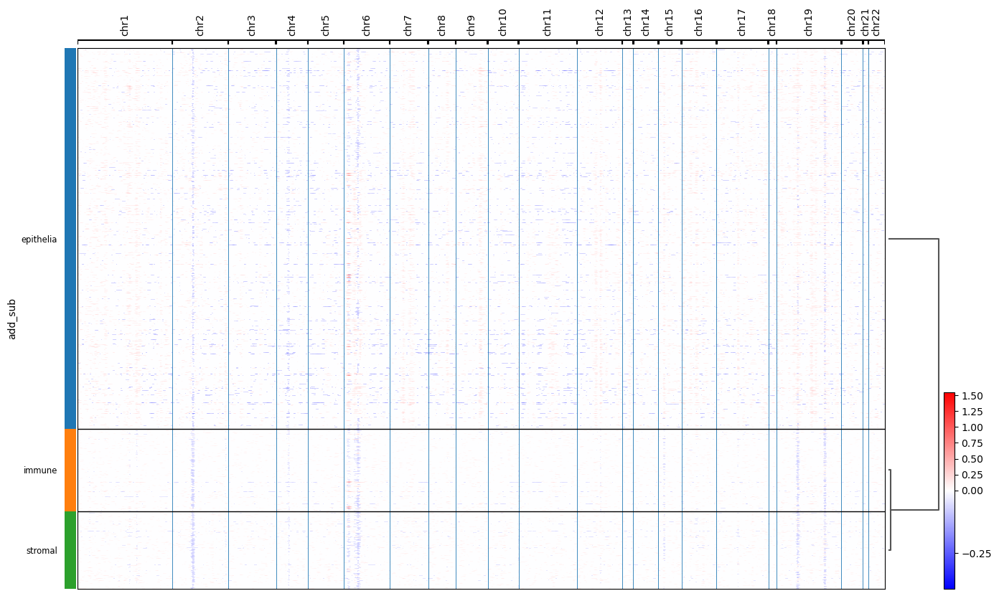

In [16]:
cnv.pl.chromosome_heatmap(adata, groupby="add_sub", dendrogram=True)

Note:

In [ ]:
cnv.pl.chromosome_heatmap(adata, groupby="add_ist", dendrogram=True)

/home/augusta/anaconda3/envs/scanpy_env/lib/python3.12/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1571 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


categories: 0, 1, 2
var_group_labels: chr1, chr2, chr3, etc.


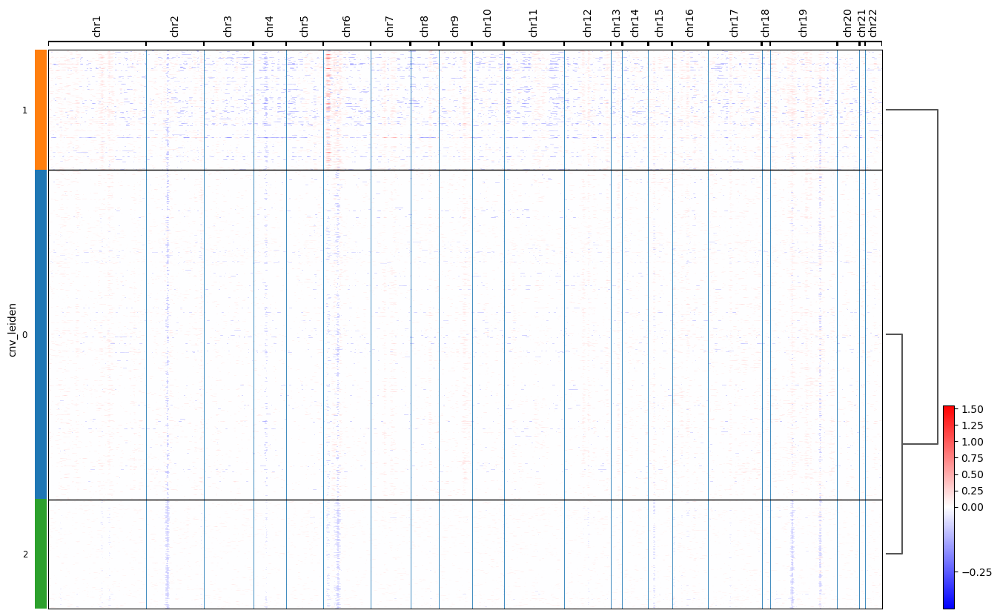

In [18]:
cnv.pl.chromosome_heatmap(adata, groupby="cnv_leiden", dendrogram=True)

Note: there seems to be three major clusters with different CNV profiles, where nbr 1 have more CNVs than the others, notably a gain in chr 6. 

In [27]:
adata

AnnData object with n_obs × n_vars = 497627 × 18555
    obs: 'Unnamed: 0', 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'version', 'Run_name', 'Run_Tissue_name', 'tissue', 'Panel', 'assay_type', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nCount_falsecode', 'nFeature_falsecode', 'Area.um2', 'cell', 'sid', 'add_cell_id', 'add_ist', 'add_sub', 'cnv_leiden', 'n_counts', 'cnv_score'
    var: 'Unnamed: 0', 'start', 'end', 'width', 'names', 'gene_id', 'symbol', 'ensg', 'chromosome'
    uns: 'cnv', 'cnv_neighbors', 'cnv_leiden', 'add_sub_colors', 'pca', 'dendrogram_add_sub', 'add_ist_colors', 'dendrogram_add_ist', 'cnv_leiden_colors', 'dendrogram_cnv_leiden', 'log1p', 'neig

#### Plot CNV umap

In [37]:
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)

In [ ]:
cnv.pl.umap(adata,color=['cnv_leiden', 'cnv_score'], s=0.5)

#### Pre-processing of data, PCA, UMAP

In [21]:
sc.pp.filter_cells(adata,min_counts=10)
adata.layers['raw']=adata.X
sc.pp.normalize_total(adata)

In [22]:
sc.pp.log1p(adata)

In [23]:
sc.pp.pca(adata)

In [24]:
sc.pp.neighbors(adata,n_pcs=40)

In [51]:
sc.tl.leiden(adata, n_iterations=2)

IOStream.flush timed out


In [25]:
sc.tl.umap(adata)

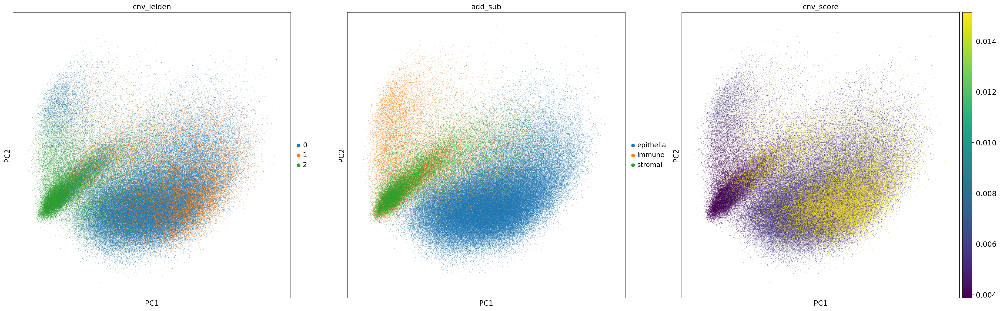

In [50]:
sc.pl.pca(adata, color=['cnv_leiden', 'add_sub', 'cnv_score'], s=1)

In [ ]:
sc.pl.umap(adata,color=['leiden','cnv_leiden', 'add_sub' ,'add_ist', 'cnv_score'], s=1)

Note: Unlike the B197 sample, the immune and stromal cells are not represented by one cnv cluster, but rather all three.

#### Plot spatial

In [28]:
import numpy as np
adata.obsm['spatial']=np.array(adata.obs.loc[:,['CenterX_global_px','CenterY_global_px']])

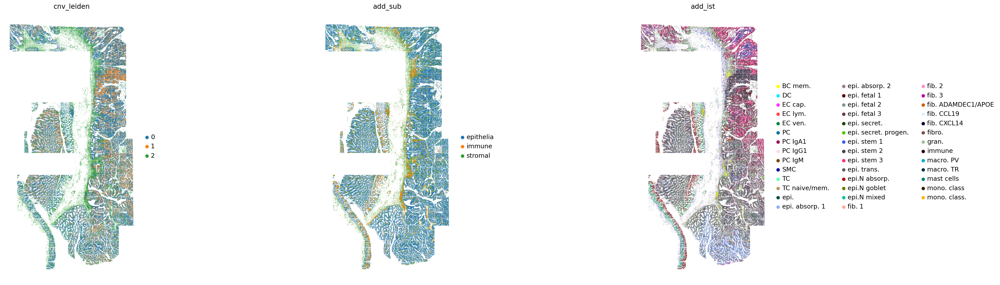

In [29]:
sc.settings.set_figure_params(figsize=(10, 10))
sc.pl.spatial(adata,color=['cnv_leiden', 'add_sub', 'add_ist'] ,spot_size=120,frameon=False)

Note: There seem to be more of the CNV cluster 1 (chr 6p gain) at a position with lots of "epi. stem2"or is it something else?